**Download cats and dogs dataset**

In [7]:
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip \
    -O /tmp/cats_and_dogs_filtered.zip

--2019-04-17 18:24:40--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.132.128, 2607:f8b0:4001:c07::80
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.132.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘/tmp/cats_and_dogs_filtered.zip’

/tmp/cats_and_dogs_ 100%[===================>]  65.43M   230MB/s    in 0.3s    

2019-04-17 18:24:40 (230 MB/s) - ‘/tmp/cats_and_dogs_filtered.zip’ saved [68606236/68606236]



 **Libraries**

In [0]:
import os
import zipfile
from keras import layers
from keras.applications import VGG19
from keras import models
from keras import optimizers
from keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import numpy as np
from keras import backend as K
from keras.preprocessing import image
from keras.applications.vgg19 import preprocess_input, decode_predictions
from keras import utils
import cv2
from google.colab.patches import cv2_imshow

**Training and Validation set initialization**

In [0]:
localZip = '/tmp/cats_and_dogs_filtered.zip'
zipRef = zipfile.ZipFile(localZip, 'r')
zipRef.extractall('/tmp')
zipRef.close()
baseDir = '/tmp/cats_and_dogs_filtered'
trainDir = os.path.join(baseDir, 'train')
validDir = os.path.join(baseDir, 'validation')

In [0]:
trainCatsDir = os.path.join(trainDir, 'cats')
trainDogsDir = os.path.join(trainDir, 'dogs')
validCatsDir = os.path.join(validDir, 'cats')
validDogsDir = os.path.join(validDir, 'dogs')

In [11]:
conv_base = VGG19(
    weights = 'imagenet',
    include_top = False,
    input_shape = (224,224,3)
  )

conv_base.summary()
conv_base.trainable = False
for layer in conv_base.layers:
  layer.trainable = False

Instructions for updating:
Colocations handled automatically by placer.
80142336/80134624 [==============================] - 2s 0us/step
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_____

In [12]:
finalLayer = conv_base.get_layer('block5_pool')
finalOutput = finalLayer.output
convnet = layers.Flatten()(finalOutput)
convnet = layers.Dense(256, activation = 'relu')(convnet)
convnet = layers.Dense(1, activation = 'sigmoid')(convnet)
model = models.Model(conv_base.input, convnet)
model.compile(loss='binary_crossentropy', optimizer = optimizers.RMSprop(lr=0.0001), metrics=['acc'])

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [13]:
trainDatagen = ImageDataGenerator(
    rescale= 1./255,
    rotation_range = 40,
    width_shift_range = 0.2,
    height_shift_range = 0.2,
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

trainGenerator = trainDatagen.flow_from_directory(
    trainDir,
    target_size = (224,224),
    batch_size = 20,
    class_mode = 'binary'
)

validDatagen = ImageDataGenerator(rescale = 1./255)
validGenerator = validDatagen.flow_from_directory(
    validDir,
    target_size = (224, 224),
    batch_size = 20,
    class_mode = 'binary'
)

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


**Compile**

In [0]:
model.compile(
    loss='binary_crossentropy',
    optimizer=optimizers.RMSprop(lr=2e-5),
    metrics=['acc']
)

**Train**

In [15]:
history = model.fit_generator(
    trainGenerator,
    steps_per_epoch = 100,
    epochs = 50,
    validation_data = validGenerator,
    validation_steps = 50
)

Instructions for updating:
Use tf.cast instead.
Epoch 1/50
100/100 [==============================] - 37s 369ms/step - loss: 0.5953 - acc: 0.6720 - val_loss: 0.5002 - val_acc: 0.7400
Epoch 2/50
100/100 [==============================] - 33s 329ms/step - loss: 0.4707 - acc: 0.7815 - val_loss: 0.3530 - val_acc: 0.8530
Epoch 3/50
100/100 [==============================] - 31s 309ms/step - loss: 0.4298 - acc: 0.8065 - val_loss: 0.2994 - val_acc: 0.8780
Epoch 4/50
100/100 [==============================] - 31s 314ms/step - loss: 0.3844 - acc: 0.8280 - val_loss: 0.2788 - val_acc: 0.8810
Epoch 5/50
100/100 [==============================] - 33s 327ms/step - loss: 0.3772 - acc: 0.8285 - val_loss: 0.3167 - val_acc: 0.8600
Epoch 6/50
100/100 [==============================] - 31s 312ms/step - loss: 0.3596 - acc: 0.8360 - val_loss: 0.3247 - val_acc: 0.8580
Epoch 7/50
100/100 [==============================] - 33s 327ms/step - loss: 0.3443 - acc: 0.8480 - val_loss: 0.2282 - val_acc: 0.9020
Epoch 8

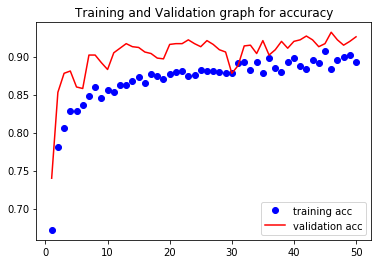

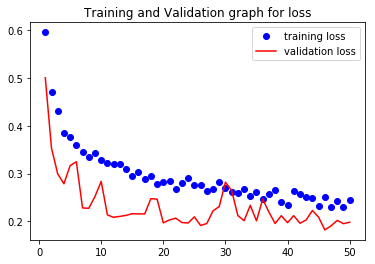

In [16]:
%matplotlib inline

import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)


plt.plot(epochs, acc, 'bo', label='training acc')
plt.plot(epochs, val_acc, 'r', label='validation acc')
plt.title('Training and Validation graph for accuracy')
plt.legend()

plt.figure()


plt.plot(epochs, loss, 'bo', label='training loss')
plt.plot(epochs, val_loss, 'r', label='validation loss')
plt.title('Training and Validation graph for loss')
plt.legend()

plt.show()

***Question 2***

In [0]:
conv_base.trainable = True
setTrainable = False
for layer in conv_base.layers:
  if layer.name == 'block5_conv1':
    setTrainable = True
  if setTrainable:
    layer.trainable = True
  else: layer.trainable = False
    
    
model.compile(
    loss='binary_crossentropy', 
    optimizer=optimizers.RMSprop(lr=1e-5), 
    metrics=['acc'])

In [18]:
model.summary()
history = model.fit_generator(
    trainGenerator,
    steps_per_epoch = 100,
    epochs = 50,
     validation_data=validGenerator,
    validation_steps=50
)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

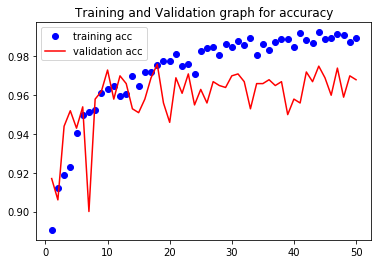

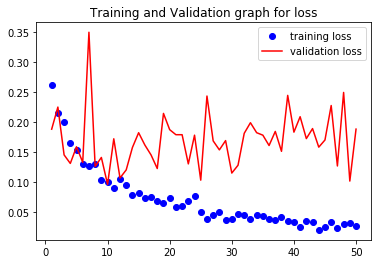

In [19]:
%matplotlib inline

acc = history.history['acc']
val_acc = history.history['val_acc']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)


plt.plot(epochs, acc, 'bo', label='training acc')
plt.plot(epochs, val_acc, 'r', label='validation acc')
plt.title('Training and Validation graph for accuracy')
plt.legend()

plt.figure()


plt.plot(epochs, loss, 'bo', label='training loss')
plt.plot(epochs, val_loss, 'r', label='validation loss')
plt.title('Training and Validation graph for loss')
plt.legend()

plt.show()

**Question 3 -Heatmap**

In [43]:

%matplotlib inline

last_conv_layer = model.get_layer("block5_conv4")
!ls /tmp/cats_and_dogs_filtered/validation/cats | head -3
!ls /tmp/cats_and_dogs_filtered/validation/dogs | head -3

cat.2000.jpg
cat.2001.jpg
cat.2002.jpg
dog.2000.jpg
dog.2001.jpg
dog.2002.jpg


In [0]:
def show_superimposed_image(img_path, heatmap):

  img = cv2.imread(img_path)
  # resize the heatmap to be the same size as the original image
  heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

  heatmap = np.uint8(255 * heatmap)

  heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

  superimposed_img = heatmap * 0.4 + img

  cv2_imshow(superimposed_img)
  
def process_image(img_path, idx=0):
  img = image.load_img(img_path, target_size=(224, 224))
  plt.imshow(img)
  plt.grid(None)
  plt.show()
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  x = preprocess_input(x)
  preds = model.predict(x)
  class_index = np.argsort(preds[0])[-(1+idx)]
  
  class_output = model.output[:, class_index]
  grads = K.gradients(model.output[:, 0], last_conv_layer.output)[0]
  pooled_grads = K.mean(grads, axis=(0, 1, 2))
  iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])
  pooled_grads_value, conv_layer_output_value = iterate([x])
  
  heatmap = np.mean(conv_layer_output_value, axis=-1)
  heatmap = np.maximum(heatmap, 0)
  heatmap /= np.max(heatmap)

  plt.matshow(heatmap)
  plt.grid(None)
  plt.show()
  show_superimposed_image(img_path, heatmap)

In [33]:
!ls /tmp/cats_and_dogs_filtered/validation/dogs/

dog.2000.jpg  dog.2100.jpg  dog.2200.jpg  dog.2300.jpg	dog.2400.jpg
dog.2001.jpg  dog.2101.jpg  dog.2201.jpg  dog.2301.jpg	dog.2401.jpg
dog.2002.jpg  dog.2102.jpg  dog.2202.jpg  dog.2302.jpg	dog.2402.jpg
dog.2003.jpg  dog.2103.jpg  dog.2203.jpg  dog.2303.jpg	dog.2403.jpg
dog.2004.jpg  dog.2104.jpg  dog.2204.jpg  dog.2304.jpg	dog.2404.jpg
dog.2005.jpg  dog.2105.jpg  dog.2205.jpg  dog.2305.jpg	dog.2405.jpg
dog.2006.jpg  dog.2106.jpg  dog.2206.jpg  dog.2306.jpg	dog.2406.jpg
dog.2007.jpg  dog.2107.jpg  dog.2207.jpg  dog.2307.jpg	dog.2407.jpg
dog.2008.jpg  dog.2108.jpg  dog.2208.jpg  dog.2308.jpg	dog.2408.jpg
dog.2009.jpg  dog.2109.jpg  dog.2209.jpg  dog.2309.jpg	dog.2409.jpg
dog.2010.jpg  dog.2110.jpg  dog.2210.jpg  dog.2310.jpg	dog.2410.jpg
dog.2011.jpg  dog.2111.jpg  dog.2211.jpg  dog.2311.jpg	dog.2411.jpg
dog.2012.jpg  dog.2112.jpg  dog.2212.jpg  dog.2312.jpg	dog.2412.jpg
dog.2013.jpg  dog.2113.jpg  dog.2213.jpg  dog.2313.jpg	dog.2413.jpg
dog.2014.jpg  dog.2114.jpg  dog.2214.jpg  dog.23

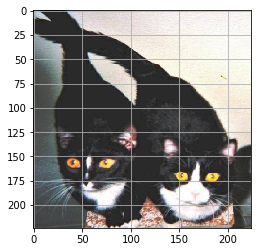

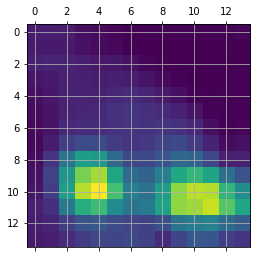

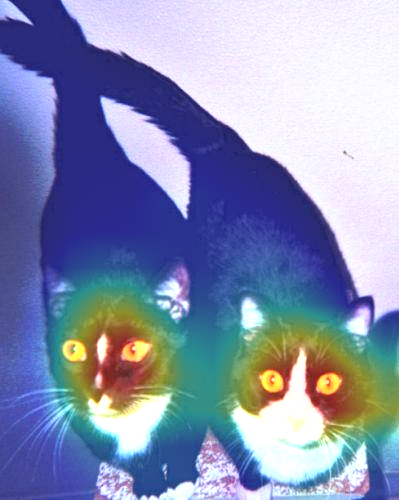

In [23]:
process_image('/tmp/cats_and_dogs_filtered/validation/cats/cat.2126.jpg')


In [35]:
!ls /tmp/cats_and_dogs_filtered/validation/dogs/dog.2126.jpg

/tmp/cats_and_dogs_filtered/validation/dogs/dog.2126.jpg


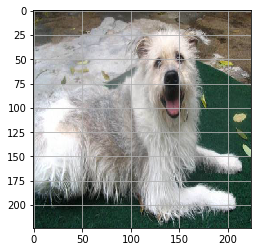

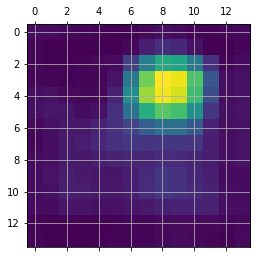

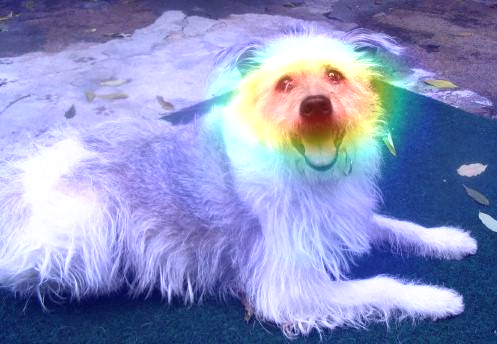

In [36]:
process_image('/tmp/cats_and_dogs_filtered/validation/dogs/dog.2126.jpg')

***Question 4***

In [37]:
!ls /tmp/cats_and_dogs_filtered/validation/cats/ | head -10
!ls /tmp/cats_and_dogs_filtered/validation/dogs/ | head -10

cat.2000.jpg
cat.2001.jpg
cat.2002.jpg
cat.2003.jpg
cat.2004.jpg
cat.2005.jpg
cat.2006.jpg
cat.2007.jpg
cat.2008.jpg
cat.2009.jpg
dog.2000.jpg
dog.2001.jpg
dog.2002.jpg
dog.2003.jpg
dog.2004.jpg
dog.2005.jpg
dog.2006.jpg
dog.2007.jpg
dog.2008.jpg
dog.2009.jpg


In [0]:
def createImageTensor(imgPath):
  img = image.load_img(imgPath, target_size = (224,224))
  imgTensor = image.img_to_array(img)
  imgTensor = np.expand_dims(imgTensor, axis = 0)
  imgTensor /= 255.
  return imgTensor

In [0]:
imgPath = '/tmp/cats_and_dogs_filtered/validation/dogs/dog.2126.jpg'
dog2126Tensor = createImageTensor(imgPath)

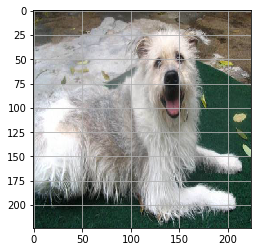

In [49]:
%matplotlib inline

plt.imshow(dog2126Tensor[0])
plt.grid(None)
plt.show()

In [50]:
model.predict(dog2126Tensor)

array([[1.]], dtype=float32)

In [51]:
layerOps = [layer.output for layer in model.layers[1:25]]
activationModel = models.Model(outputs = layerOps, input = model.input)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=[<tf.Tenso..., inputs=Tensor("in...)`
  


In [0]:
activations = activationModel.predict(dog2126Tensor)

In [0]:
def visualizeConvNETs(layerIndex):
  
  layer_name = model.layers[layerIndex].name
  
  images_per_row = 16

  layer_activation = activations[layerIndex-1]
  # the feature map has shape (1, size, size, n_features)
  n_features = activations[layerIndex-1].shape[-1] 
  size = layer_activation.shape[1]
  n_cols = n_features // images_per_row
  display_grid = np.zeros((size * n_cols, images_per_row * size))

  for col in range(n_cols):
    for row in range(images_per_row):
      channel_image = layer_activation[0, :, :, col * images_per_row + row]

      channel_image -= channel_image.mean()
      if(channel_image.std() != 0):
        channel_image /= channel_image.std()
      channel_image *= 64
      channel_image += 128
      channel_image = np.clip(channel_image, 0, 255).astype('uint8')
      display_grid[
          col * size : (col + 1) * size,
          row * size : (row + 1) * size] = channel_image


  scale = 1. / size
  plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
  plt.title(layer_name)
  plt.grid(False)
  plt.imshow(display_grid, aspect='auto', cmap='viridis')

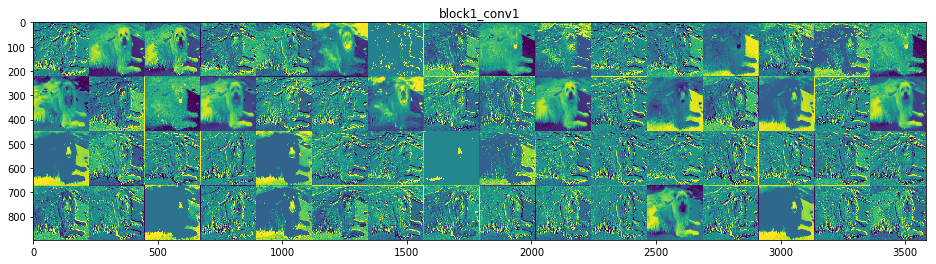

In [54]:
visualizeConvNETs(1)

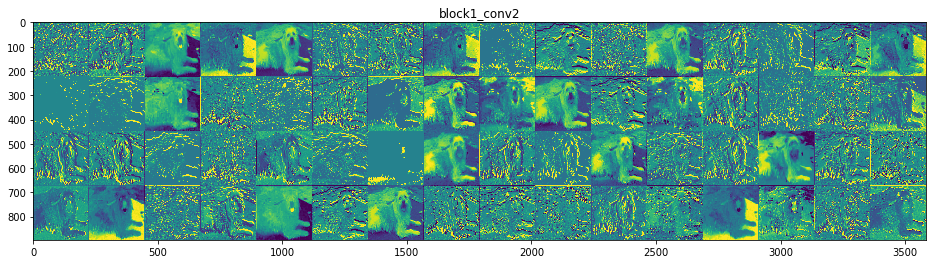

In [55]:
visualizeConvNETs(2)

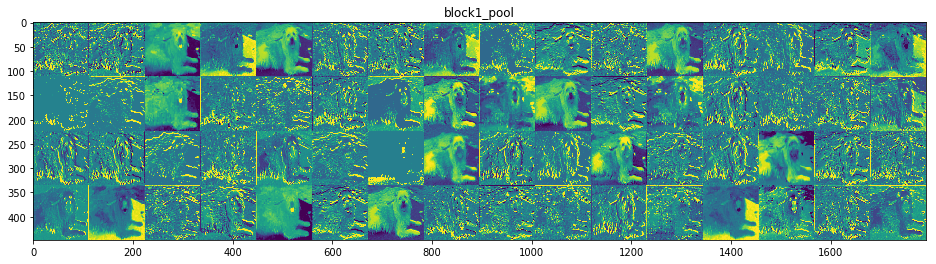

In [56]:
visualizeConvNETs(3)

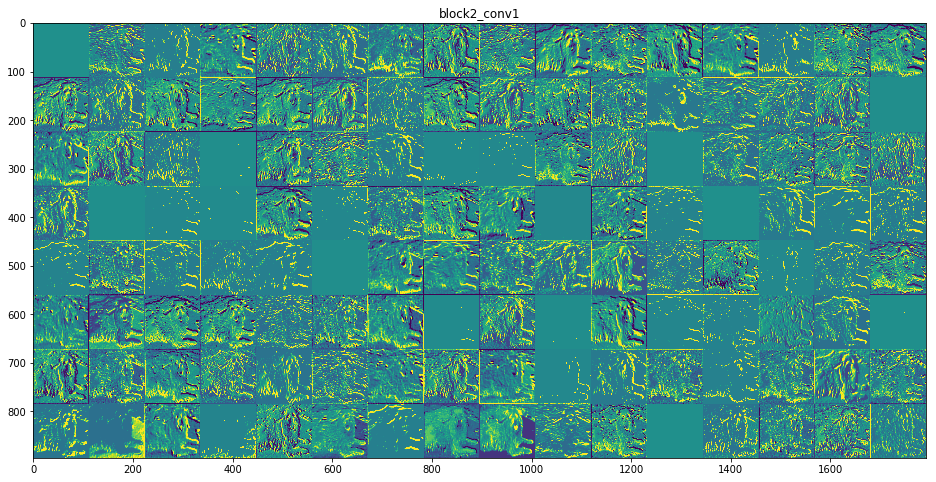

In [57]:
visualizeConvNETs(4)

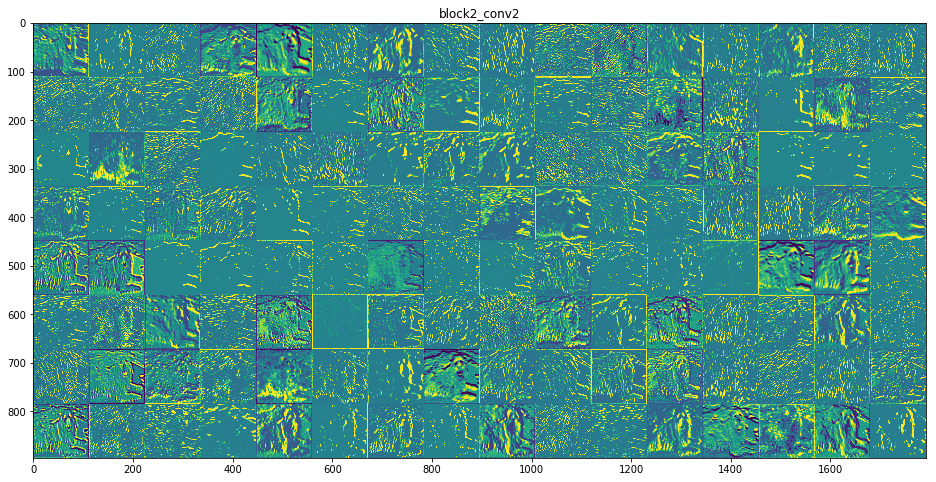

In [58]:
visualizeConvNETs(5)

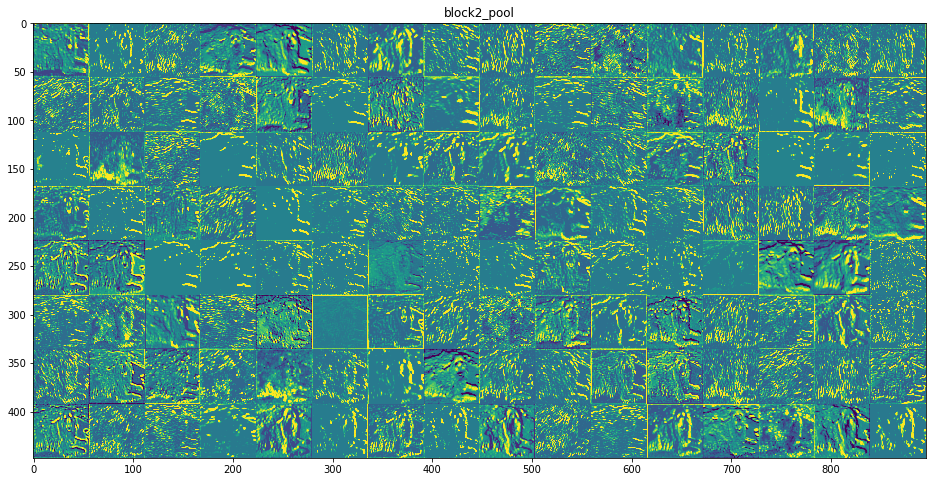

In [59]:
visualizeConvNETs(6)

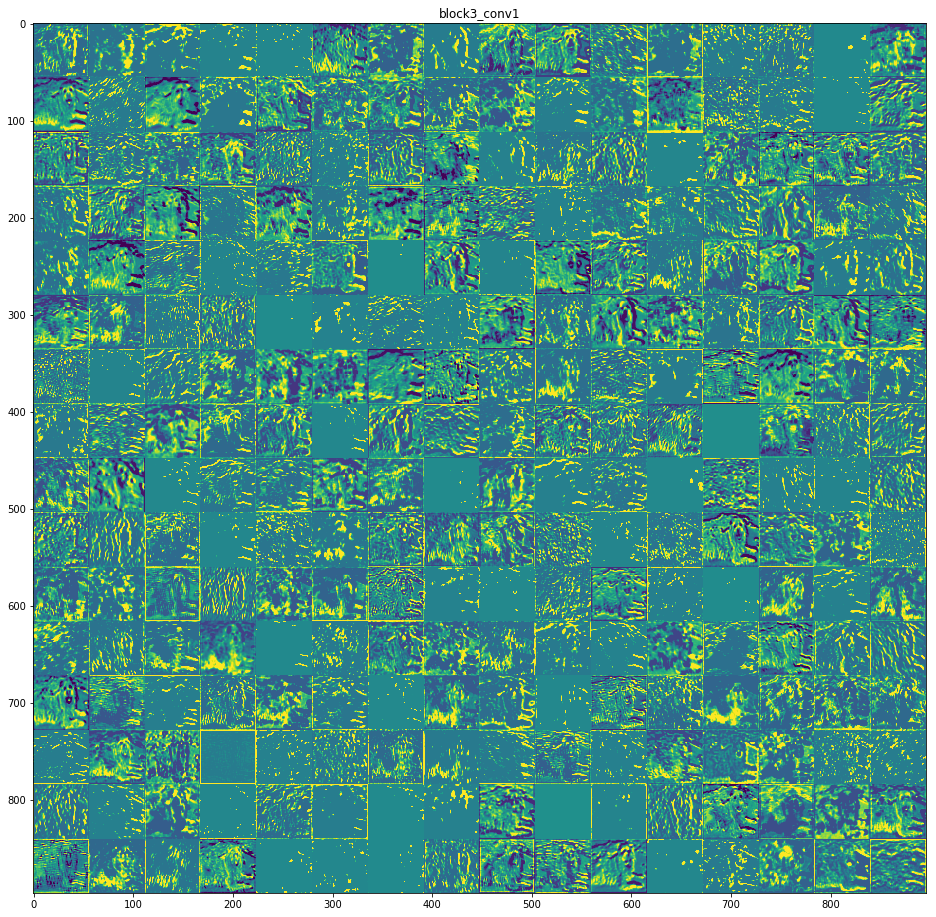

In [60]:
visualizeConvNETs(7)

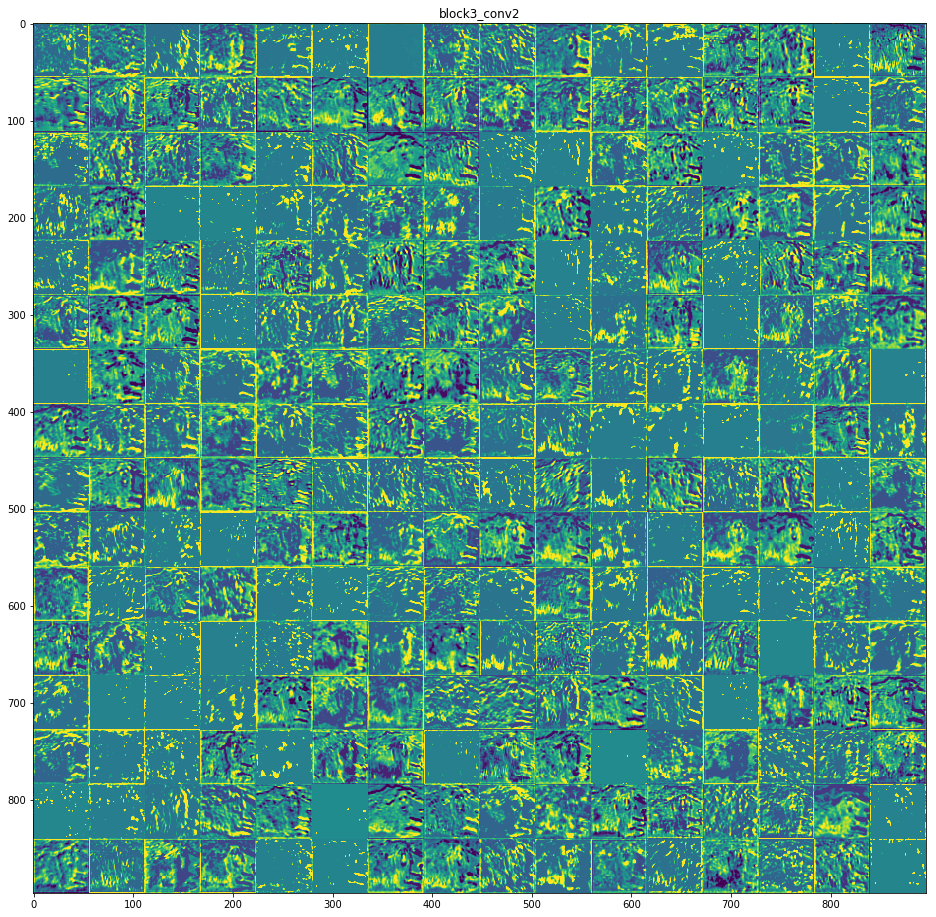

In [61]:
visualizeConvNETs(8)

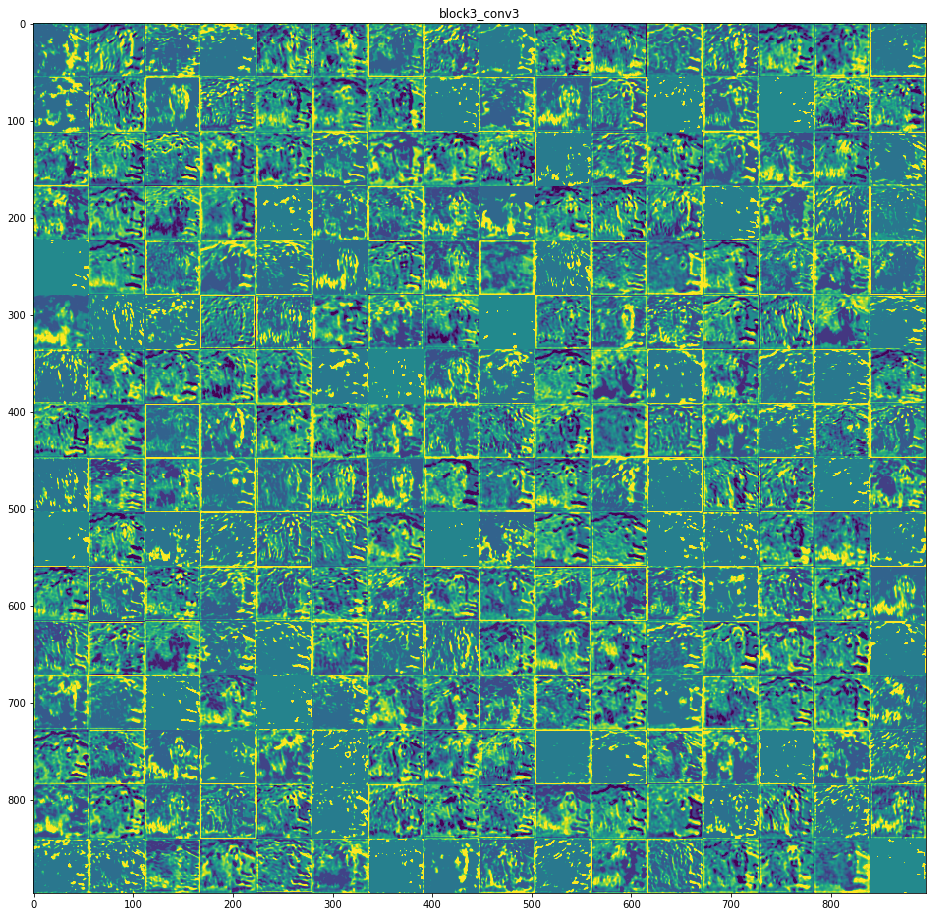

In [62]:
visualizeConvNETs(9)

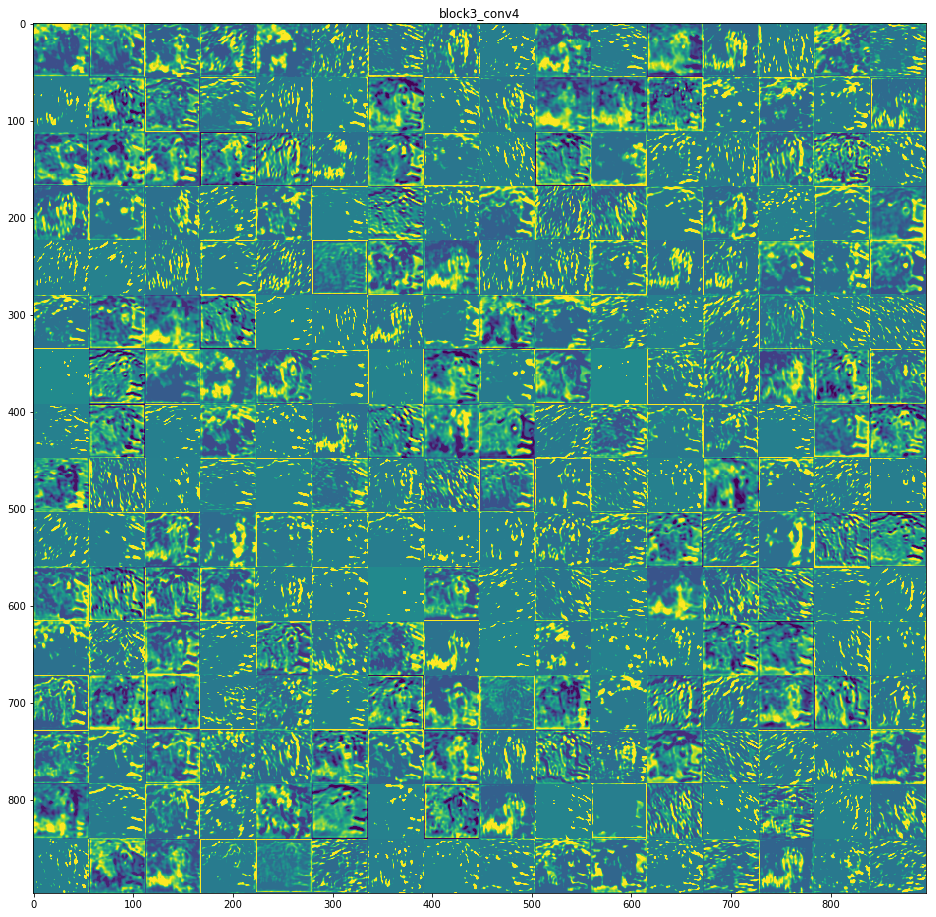

In [63]:
visualizeConvNETs(10)

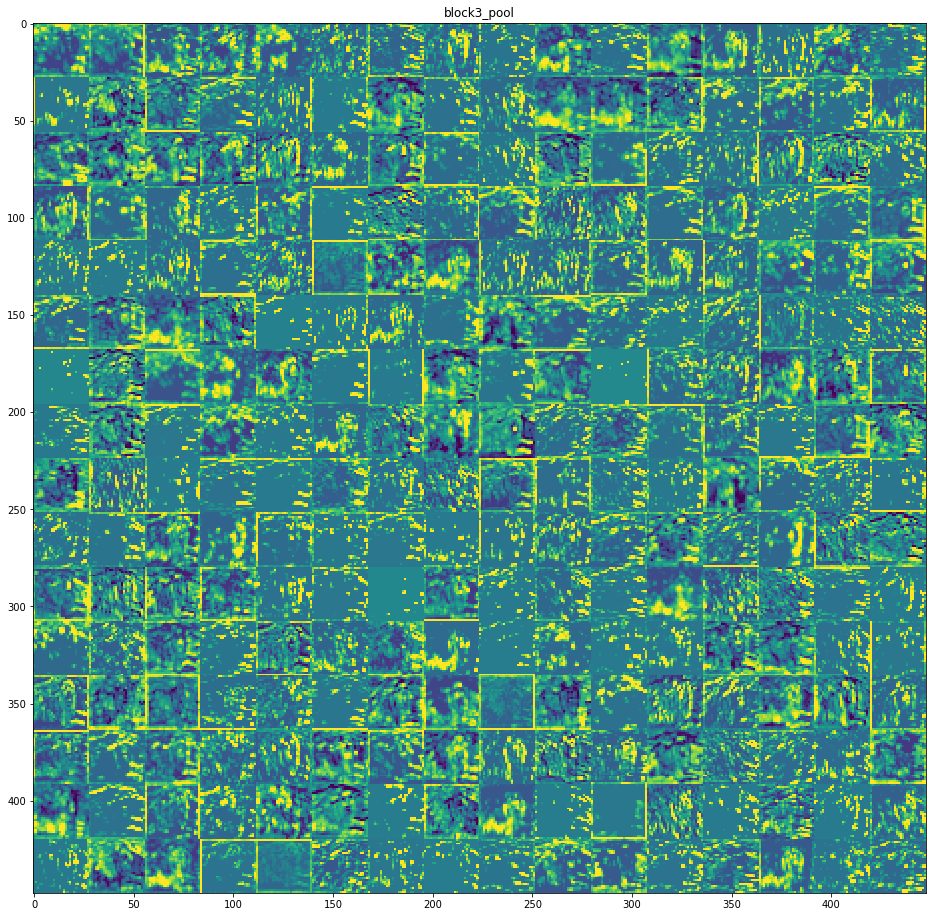

In [64]:
visualizeConvNETs(11)

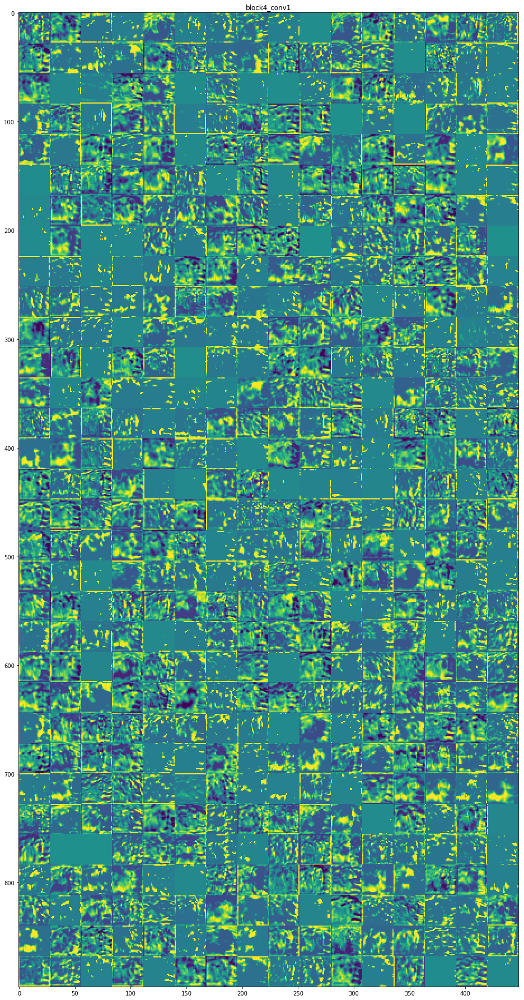

In [65]:
visualizeConvNETs(12)

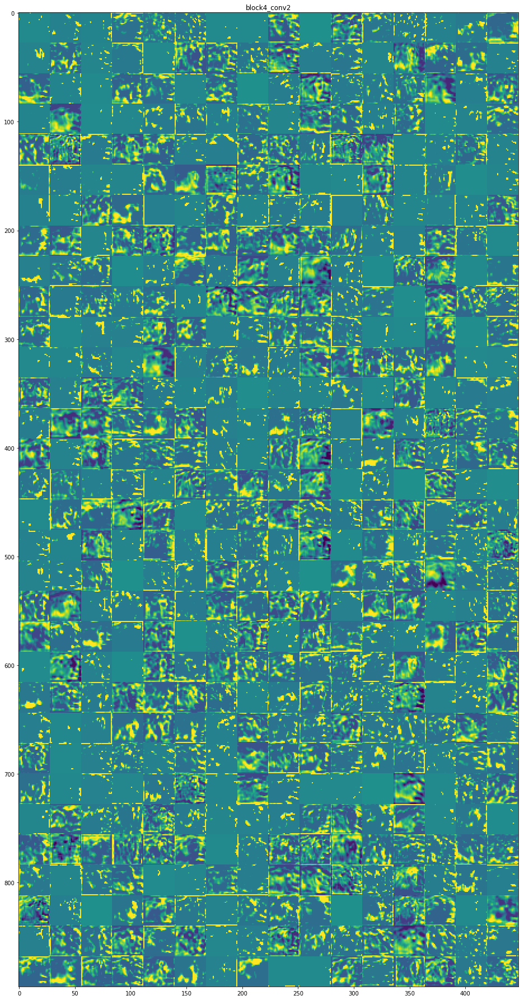

In [66]:
visualizeConvNETs(13)

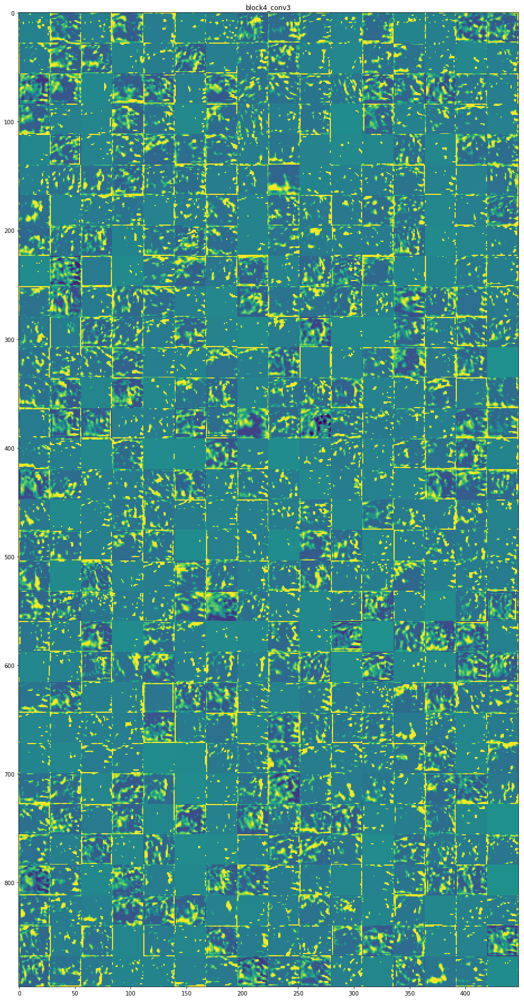

In [67]:
visualizeConvNETs(14)

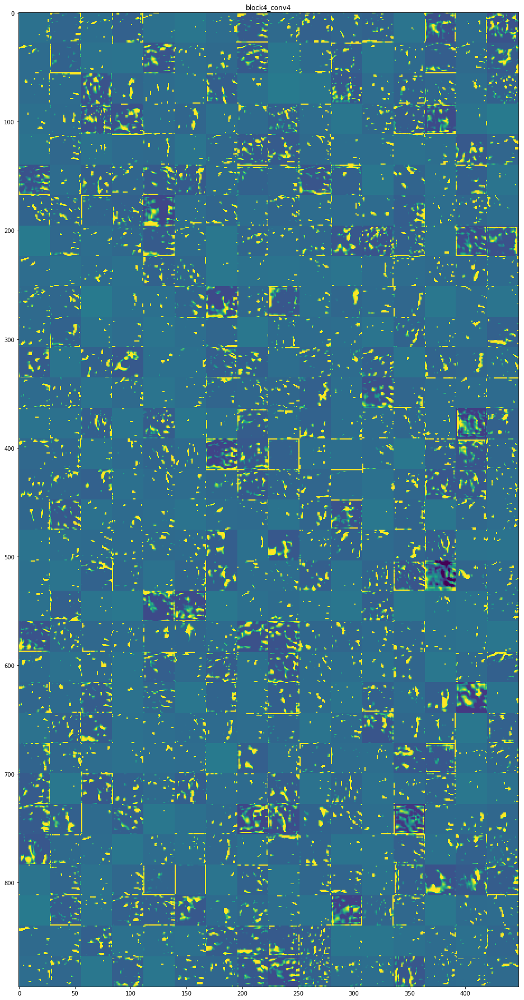

In [68]:
visualizeConvNETs(15)

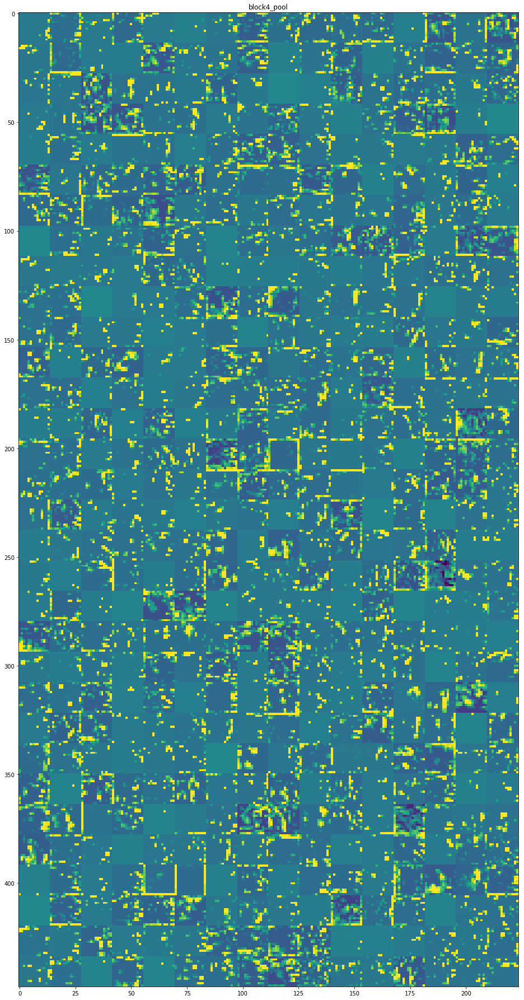

In [69]:
visualizeConvNETs(16)

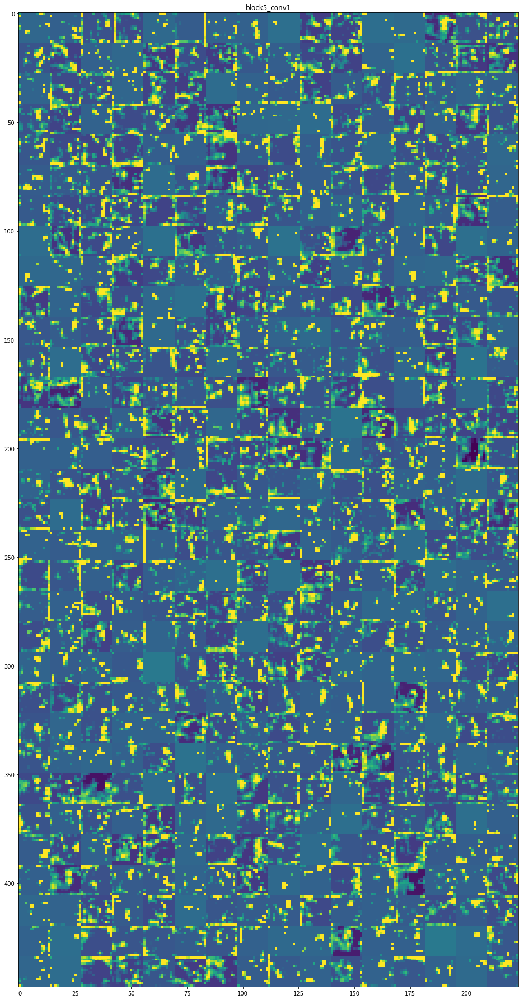

In [70]:
visualizeConvNETs(17)

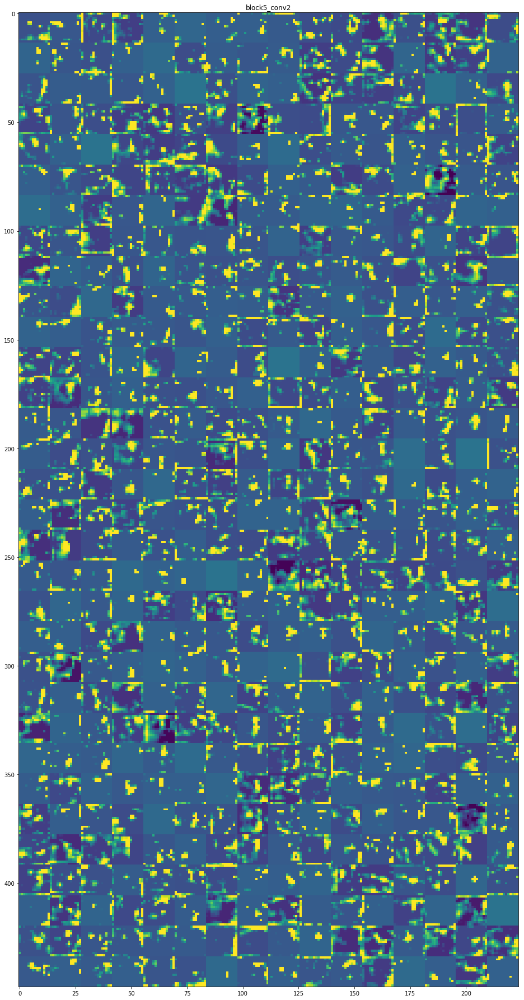

In [71]:
visualizeConvNETs(18)

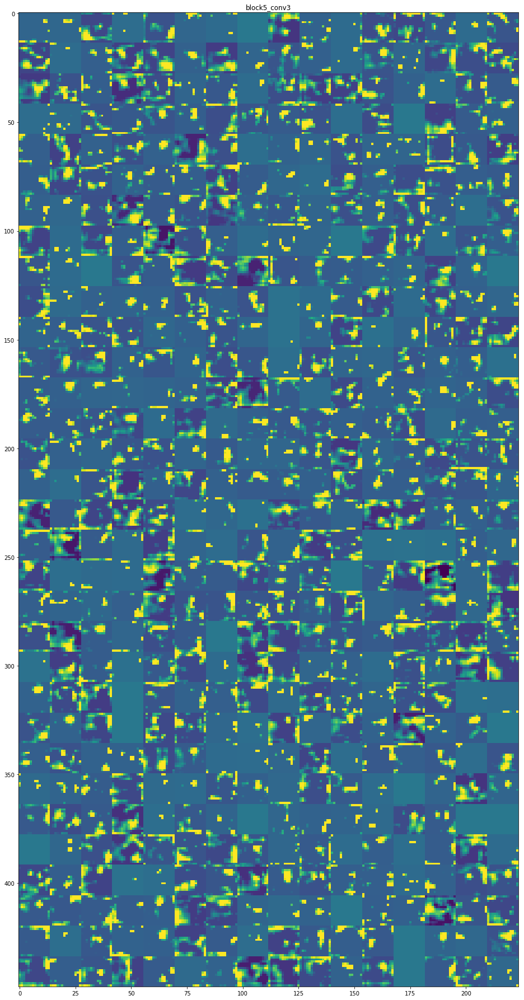

In [72]:
visualizeConvNETs(19)

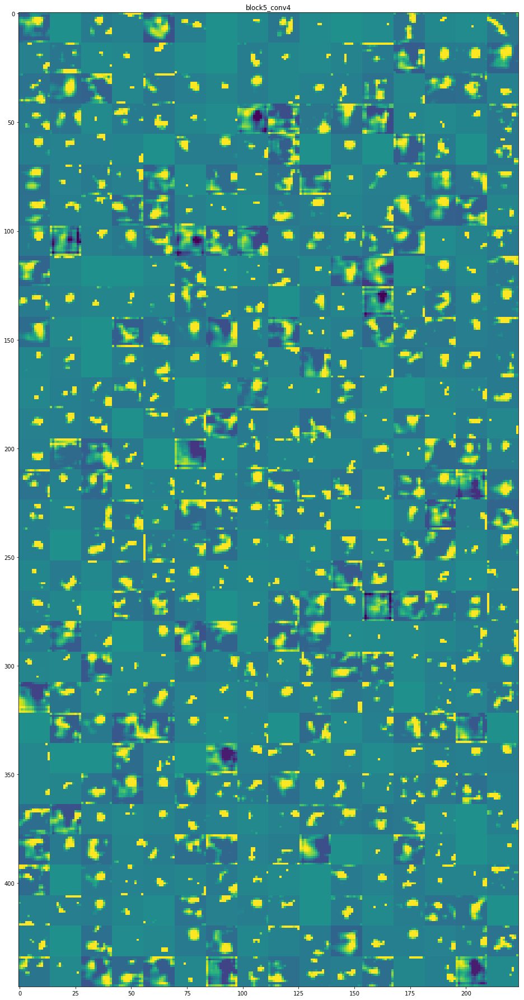

In [73]:
visualizeConvNETs(20)

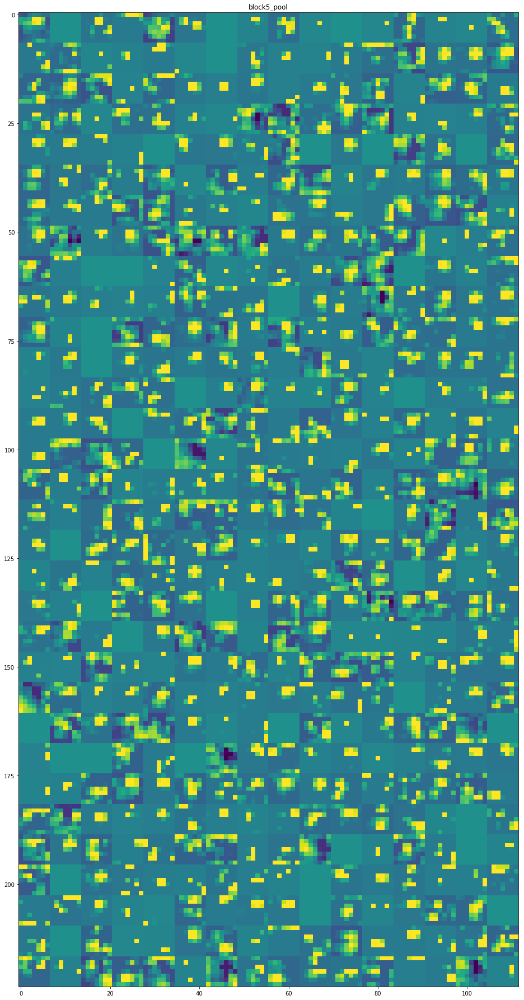

In [74]:
visualizeConvNETs(21)